## Homework 2 - How do Taxis move in NYC?

### Group #29 : Riccardo Cervelli, Edoardo Gallo, Hifsa Tahreem.

For this Homework, we work with a really big dataset – So we downloaded tens of gigabytes of data from the New York City Taxi and Limousine Commission and set out to produce some deep analyses of taxi ride patterns.
This DataFrame is Humongous – 10 million taxi trips per month . So i opted to reduce my scope first of all deleting usless Data.
The aim of this HW.2 is that may help Taxi drivers in planning their movements throughout the city and the Taxi's users to have hints about the convenience of enjoying this service throughout different useful python's passages.

Throughout this analysis we want discover in what period of the year Taxis are used more , what are the time slots with more passengers 
if the duration of  all trips last the same, and so on and so for. 


JUST OUR OPINION..

The result of analysis can be used to :
- help taxi drivers to decide in which area they need to go so they get maximum customers and boost their business,
- New taxi business can also gain from the analysis,
- Traffic analysis: Finds which routes and times of the day are heavy on traffic,
- Provide visualization like heated maps and route visualization.

In [1]:
import pandas
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import json
import folium
import os
import scipy
import branca.colormap as cm
import scipy.stats as stat
from datetime import datetime
from scipy.stats import chi2
from branca.colormap import linear

In this first step, it is possible intuitively to understand what types of libraries have been used and then get an idea of what kind of work will be done, with pandas we can work with a dataframe, matplotlib for our graphs, folium and colormap, for our interactive maps etc..

EXPLANATORY VARIABLES/ FEATURES
- id character. A unique identifier for each trip.
- vendor_id integer. A code indicating the provider associated with the trip record.
- pickup_datetime character. The date and time when the meter was engaged. This is currently a combination of date and time.
- dropoff_datetime character. The date and time when the meter was disengaged. As above this is a combination of date and time.
- passenger_count integer. The number of passengers in the vehicle (driver entered value). 
- dropoff_longitude numeric. The longitude where the meter was disengaged.
- dropoff_latitude numeric. The latitude where the meter was disengaged.
RESPONSE VARIABLE/ OUTCOME
- trip_duration integer. The duration of the trip in seconds.

In [2]:
borough_names = ['Manhattan','Brooklyn','Queens','Bronx','Staten Island','EWR']
# with pandas.read_csv i have imported my csv file, but only the useful column for our analysis
data_zone = pandas.read_csv('taxi _zone_lookup.csv',usecols=[0,1])
#and here i created a new dataframe where i stored my results.
df = pd.DataFrame(columns=['Manhattan','Brooklyn','Queens','Bronx','Staten Island','EWR'])

##### [RQ1] In what period of the year Taxis are used more? Create a plot that, for each month, shows the average number of trips recorded each day. Due to the differences among New York zones, we want to visualize the same information for each boroughs. Do you notice any difference among them? Provide comments and plausible explanations about what you observe (e.g.: what is the month with the highest daily average?).

In [3]:
for month in ['01', '02', '03', '04', '05','06']:
    data_frame = pandas.read_csv('yellow_tripdata_2018-'+month+'.csv',usecols=[1,2,3,4,7,9,16])
    
    data_frame=data_frame[data_frame.trip_distance !=0]# i took only the good values cutting the NaN, 0 or negative .
    data_frame=data_frame[data_frame.total_amount !=0]
    data_frame_zone=pd.merge(data_frame,data_zone,how ='left',left_on='PULocationID',right_on='LocationID')
    #with merge function I have merged two files.
    data_frame_zone=pd.merge(data_frame,data_zone,how ='left',left_on='PULocationID',right_on='LocationID')
    data_frame_zone = data_frame_zone [data_frame_zone.Borough != 'Unknown']# i decided to cut the value associated to Unknown, because are useless for my analysis
    
    #the next few lines were useful to transform our format, from string to datatype.
    data_frame_zone.tpep_pickup_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone['tpep_pickup_datetime']=pd.to_datetime(data_frame_zone.tpep_pickup_datetime)
    data_frame_zone.tpep_dropoff_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone.tpep_dropoff_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone['tpep_dropoff_datetime']=pd.to_datetime(data_frame_zone.tpep_dropoff_datetime)
    Travel_time=data_frame_zone['tpep_dropoff_datetime']-data_frame_zone['tpep_pickup_datetime']
    data_frame_zone.insert(loc=2,column='Travel_time',value=Travel_time)#i created a new column calls 'Travel_time'
   
    data_frame_zone.head()
    list_new = []
    
    for i in borough_names:
        borough_data = data_frame_zone.loc[(data_frame_zone['Borough'] == i)]
        day = borough_data['tpep_pickup_datetime'].dt.day
        average = sum(day.value_counts())/len(day.value_counts())
        list_new.append(int(average))
        #I added all the values of day_value_count, and divided by the length of the day_value_count
        #i created an empty list where i stored my results. You can see my results where i print df
    
    month=int(month)
    df.loc[month]=list_new

The final data set that was cleaned contains the following fields which will be used for our analysis:
- Pickup_datatime, dropoff_datetime, passenger_count, trip_distance, payment_type, fare_amount, trip_amount etc etc..


In [5]:
data_frame.head()
#my first DataFrame, only the useful column.

,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,PULocationID,payment_type,total_amount
1,2018-06-01 00:04:18,2018-06-01 00:09:18,1,1.0,230,1,8.15
2,2018-06-01 00:14:39,2018-06-01 00:29:46,1,3.3,100,2,14.30
5,2018-06-01 00:09:00,2018-06-01 00:24:01,1,2.0,161,1,15.35
6,2018-06-01 00:02:33,2018-06-01 00:13:01,2,1.5,163,1,11.75
7,2018-06-01 00:13:23,2018-06-01 00:16:52,1,0.7,186,1,8.15


In [6]:
data_frame_zone.head()
#my new DataFrame, with two new columns Travel_time and Borough.

,tpep_pickup_datetime,tpep_dropoff_datetime,Travel_time,passenger_count,trip_distance,PULocationID,payment_type,total_amount,LocationID,Borough
0,2018-06-01 00:04:18,2018-06-01 00:09:18,00:05:00,1,1.0,230,1,8.15,230,Manhattan
1,2018-06-01 00:14:39,2018-06-01 00:29:46,00:15:07,1,3.3,100,2,14.30,100,Manhattan
2,2018-06-01 00:09:00,2018-06-01 00:24:01,00:15:01,1,2.0,161,1,15.35,161,Manhattan
3,2018-06-01 00:02:33,2018-06-01 00:13:01,00:10:28,2,1.5,163,1,11.75,163,Manhattan
4,2018-06-01 00:13:23,2018-06-01 00:16:52,00:03:29,1,0.7,186,1,8.15,186,Manhattan


We took useful information from two different dataframes that we merged with the merge () function, transforming through the use of datetime all the dates from strings, to a format that could be more convenient to use to work on it.
TLC’s taxi dataset, is very extensive and contains useful variables on price, duration, distance, passengers, date, time, and most importantly, origin and destination,i reviewed the data for a period of six months. I tried to make it as clean as possible from data that was meaningless to me in this analysis.
We decided to eliminate meaningless data, like trip distance =0 or total_amount = 0 because they  were a negligible number, but also we decide to eliminate data from "Unknown" borough,  almost 816077 data, not a little number like before, but in our opinion, analyzing partial data, or in this case associated data with unknown sources, in a similar context, was not useful at all for this analysis.

In [7]:
df  # dataframe with the average of trips for day

,Manhattan,Brooklyn,Queens,Bronx,Staten Island,EWR
1,255969,3176,16614,215,3,6
2,257955,3219,16315,211,3,5
3,275346,3898,17777,311,3,6
4,270892,3775,18815,329,3,6
5,268320,3893,19271,331,3,7
6,253123,3900,18061,320,4,6


for each month, the graph,shows the average number of trips recorded each day.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a3dd1d710>,
      dtype=object)

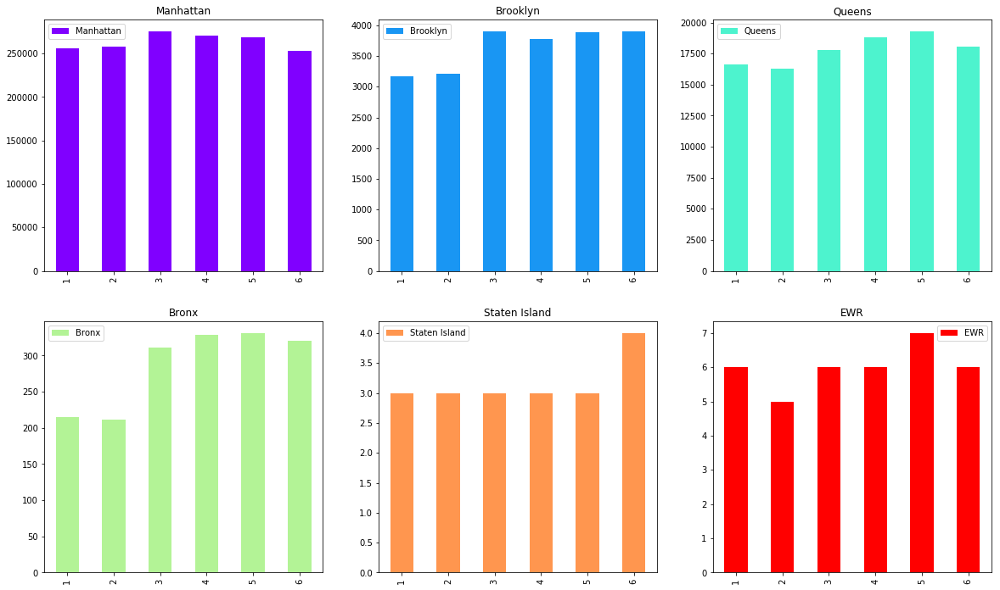

In [13]:
df.plot.bar(colormap='rainbow',figsize=(20,12),subplots=True,layout=(2,3),sharex=False)

Yes, you are reading that correctly  there were only four/six yellow cab pickups Staten Island all day.Manhattan is the is the area with the most picksupp,and how could you imagine this is correct because  Yellow taxis run almost exclusively from manhattan to the other boroughs.


##### [RQ2] What are the time slots with more passengers? Set your own time slots and discover which are those when Taxis drive the highest number of passengers overall New York and repeat the analysis for each borough. Provide the results through a visualization and comment them.

In [15]:
for month in ['01', '02', '03', '04', '05','06']:
    data_frame = pandas.read_csv('yellow_tripdata_2018-'+month+'.csv',usecols=[1,2,3,4,7,9,16])

    data_frame=data_frame[data_frame.trip_distance !=0]
    data_frame=data_frame[data_frame.total_amount !=0]
    data_frame_zone=pd.merge(data_frame,data_zone,how ='left',left_on='PULocationID',right_on='LocationID')
    
    data_frame_zone=pd.merge(data_frame,data_zone,how ='left',left_on='PULocationID',right_on='LocationID')
    data_frame_zone = data_frame_zone [data_frame_zone.Borough != 'Unknown']    
    data_frame_zone.tpep_pickup_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone['tpep_pickup_datetime']=pd.to_datetime(data_frame_zone.tpep_pickup_datetime)
    data_frame_zone.tpep_dropoff_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone.tpep_dropoff_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone['tpep_dropoff_datetime']=pd.to_datetime(data_frame_zone.tpep_dropoff_datetime)
    Travel_time=data_frame_zone['tpep_dropoff_datetime']-data_frame_zone['tpep_pickup_datetime']
    data_frame_zone.insert(loc=2,column='Travel_time',value=Travel_time)


    data_frame_zone.loc[:,'hours']=data_frame_zone['tpep_pickup_datetime'].dt.hour
    Passeggeri_ora_zona = data_frame_zone.groupby(['Borough','hours'])['passenger_count'].agg('sum')

    Passeggeri_ora_zona=Passeggeri_ora_zona.unstack().fillna(0) 
    # unstack method turns index values into column names.
    #fillna change the values  from NaN to 0
    Passeggeri_ora_zona=Passeggeri_ora_zona.transpose()
    if int(month)==1:
        Passeggeri_ora_zona_new= Passeggeri_ora_zona
    else:
        Passeggeri_ora_zona_new=Passeggeri_ora_zona_new.add(Passeggeri_ora_zona)
    #i created a new datframe, i stored for each iteration my new results, from 1 to 6 for each month

        

In [16]:
Passeggeri_ora_zona_new.head()

Borough,Bronx,Brooklyn,EWR,Manhattan,Queens,Staten Island
hours,,,,,,
0,2826.0,71557.0,3.0,2417738.0,185682.0,39.0
1,2366.0,51232.0,6.0,1698041.0,89338.0,35.0
2,2010.0,38801.0,8.0,1230722.0,43307.0,28.0
3,1815.0,30954.0,8.0,897409.0,30434.0,42.0
4,2170.0,27006.0,35.0,681714.0,42847.0,56.0


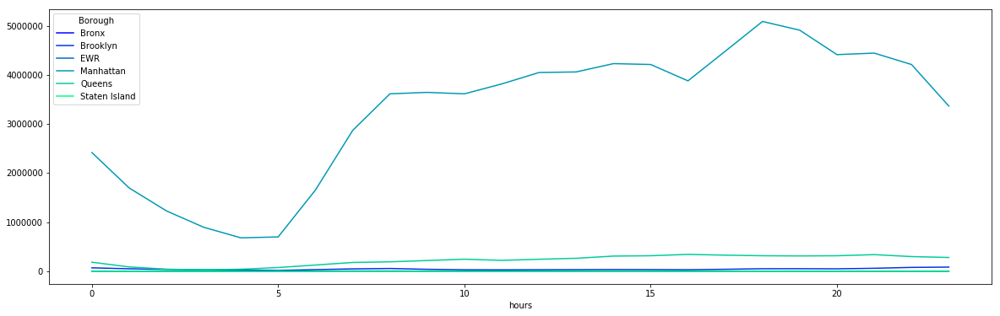

In [34]:
Passeggeri_ora_zona_new.plot(colormap='winter',figsize=(20,6) ,legend=True,layout=(5,2),sharex=False)

From this kind of graph wasn't possible to capture useful information because there was Manhattan at the beginning and the other zones at the same level, so i tried to print the same graph in differents ways . 
We'll show you our final choice.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a3eb970f0>,
      dtype=object)

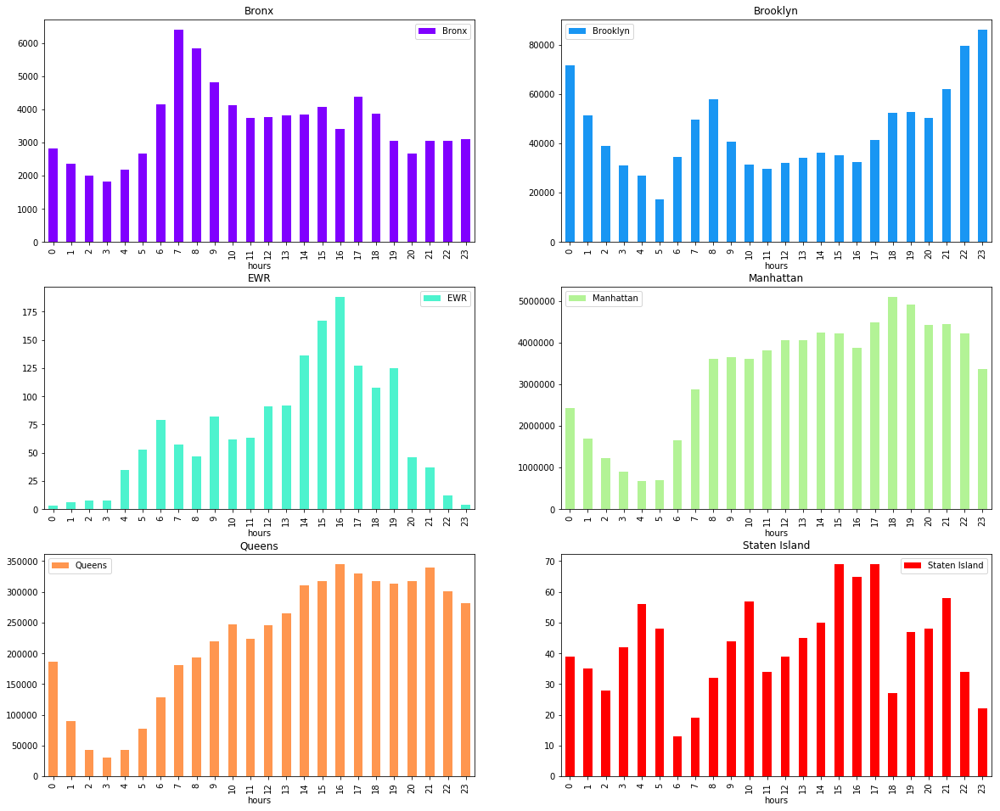

In [49]:
Passeggeri_ora_zona_new.plot.bar(colormap='rainbow',figsize=(20,28) ,legend=True,subplots=True,layout=(5,2),sharex=False)


The graph shows when Taxis drive carry the highest number of passengers for each borough , with an analysis as before.

The morning,lunch time and evening rush hours are clearly visible, as is the infamous trough in pickups corresponding to the time when cab drivers change shifts, right before the afternoon rush. New York is an all-day and all-night kind of city, as evidenced by the quite high rate of pickups during the workday and especially on into the evening: more taxi trips began in the hour before midnight than in the peak morning rush hour. (Again, this is probably because workers take transit for their more predictable morning commute, then hit the town and cab home later.

##### [RQ3] Do the all trips last the same? Let's put our attention on the distribution of trip's duration. Provide a plot for it and comment what you see. Run this analysis for NYC and for each borough (and obviously comment the results!).


In [19]:
for month in ['01', '02', '03', '04', '05','06']:
    data_frame = pandas.read_csv('yellow_tripdata_2018-'+month+'.csv',usecols=[1,2,3,4,7,9,16])

    data_frame=data_frame[data_frame.trip_distance !=0]
    data_frame=data_frame[data_frame.total_amount !=0]
    data_frame_zone=pd.merge(data_frame,data_zone,how ='left',left_on='PULocationID',right_on='LocationID')
    
    data_frame_zone=pd.merge(data_frame,data_zone,how ='left',left_on='PULocationID',right_on='LocationID')
    data_frame_zone = data_frame_zone [data_frame_zone.Borough != 'Unknown']
    data_frame_zone.tpep_pickup_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone['tpep_pickup_datetime']=pd.to_datetime(data_frame_zone.tpep_pickup_datetime)
    data_frame_zone.tpep_dropoff_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone.tpep_dropoff_datetime.str.slice(-5,-3).astype(int).head()
    data_frame_zone['tpep_dropoff_datetime']=pd.to_datetime(data_frame_zone.tpep_dropoff_datetime)
    Travel_time=data_frame_zone['tpep_dropoff_datetime']-data_frame_zone['tpep_pickup_datetime']
    data_frame_zone.insert(loc=2,column='Travel_time',value=Travel_time)


    data_frame_zone.loc[:,'hours']=data_frame_zone['tpep_pickup_datetime'].dt.hour
    Passeggeri_ora_zona = data_frame_zone.groupby(['Borough','hours'])['passenger_count'].agg('sum')

    Passeggeri_ora_zona=Passeggeri_ora_zona.unstack().fillna(0)
    Travel_time_sum=data_frame_zone.groupby(['Borough','hours'])['Travel_time'].sum()
    #i did the sum between each hour and travel time for borough
    Travel_time_new=data_frame_zone.groupby(['Borough','hours'])['Travel_time'].count()
    # and here i counted the values in my new df
    Travel_time_sum=Travel_time_sum.divide(Travel_time_new)
    Travel_time_sum=Travel_time_sum.unstack().fillna(0)#unstack().fillna(), like before.
    Travel_time_sum=Travel_time_sum.transpose()
    if int(month)==1:
        tot_Travel_time_sum= Travel_time_sum #in this cycle we want take associated value for each month
        tot_Travel_time_new=Travel_time_new
    else:
        tot_Travel_time_sum=tot_Travel_time_sum.add(Travel_time_sum)
        tot_Travel_time_new=tot_Travel_time_new.add(Travel_time_new)
        #if in our df, there is the month skip to the nextone
        #else add.
        
        
tot_Travel_time_sum=tot_Travel_time_sum.divide(tot_Travel_time_new)
    

In [32]:
Travel_time_sum

Borough,Bronx,Brooklyn,EWR,Manhattan,Queens,Staten Island
hours,,,,,,
0,00:13:22.770186,00:16:37.101474,00:00:00,00:15:29.563781,00:25:49.593794,00:55:22
1,00:22:53.716666,00:15:53.668165,00:00:51,00:14:50.207871,00:25:19.265278,00:14:55.750000
2,00:12:12.688118,00:15:35.490186,00:00:44,00:14:46.621577,00:18:51.029333,00:07:36.500000
3,00:19:30.422680,00:15:31.326779,00:00:00,00:15:31.180644,00:17:30.943061,00:09:23.500000
4,00:13:47.906474,00:16:47.062127,00:00:33.800000,00:15:57.608952,00:18:49.583412,00:20:17.250000
5,00:25:00.301948,00:16:28.194160,00:01:07,00:13:37.378800,00:28:58.213894,00:13:15.750000
6,00:28:45.721276,00:20:32.501642,00:05:50.400000,00:13:25.730977,00:38:27.198940,00:00:00
7,00:33:17.956521,00:23:01.193853,00:10:53.642857,00:15:04.299395,00:44:42.319831,01:26:48
8,00:26:36.884740,00:23:54.609833,00:03:50.333333,00:16:04.701872,00:43:38.625910,00:33:31


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a2e709828>,
      dtype=object)

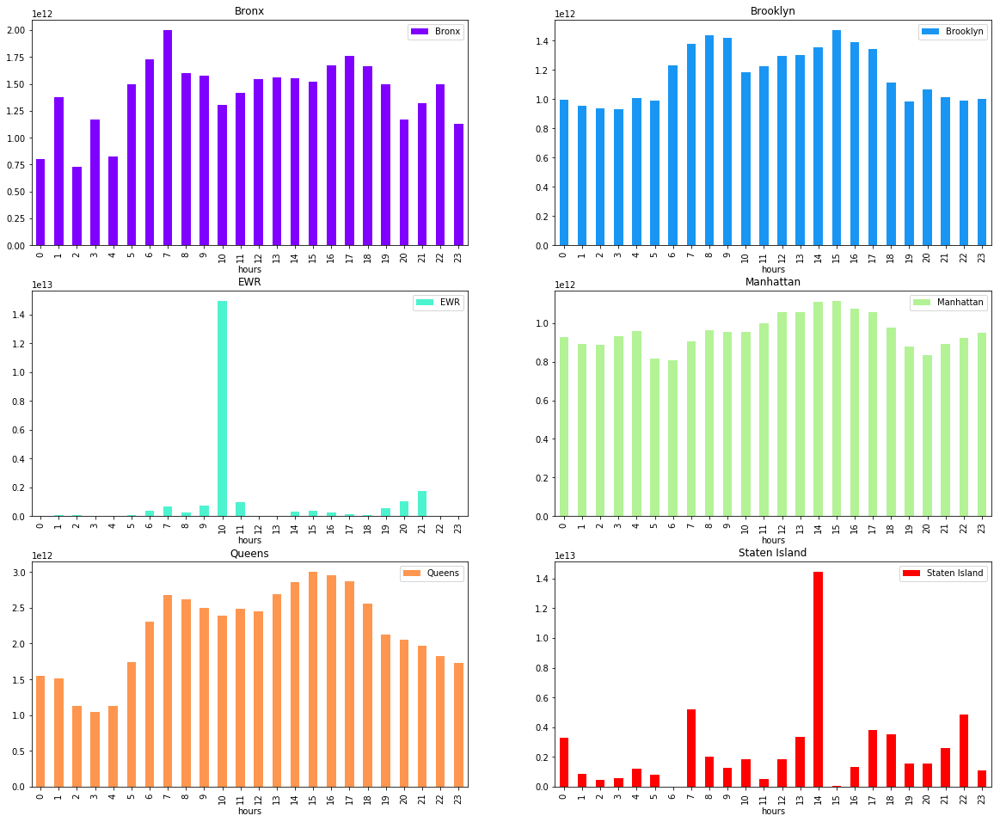

In [48]:
Travel_time_sum.plot.bar(colormap='rainbow',figsize=(20,28),subplots=True,layout=(5,2),sharex=False)

 The duration of the trips is not the same everywhere, the average of the kilometers covered for each hour is different from borough to borough, and this is because depending on the time, each zone has different times, different rhythms, more or less intense traffic , greater density of offices etc

##### [RQ4] What is the most common way of payments? Discover the way payments are executed in each borough and visualize the number of payments for any possible means. Then run the Chi-squared test to see whether the method of payment is correlated to the borough. Then, comment the results

In [20]:
for month in ['01', '02', '03', '04', '05','06']:
    data_frame = pandas.read_csv('yellow_tripdata_2018-'+month+'.csv',usecols=[1,2,3,4,7,9,16])

    data_frame=data_frame[data_frame.trip_distance !=0]
    data_frame=data_frame[data_frame.total_amount !=0]
    
    data_frame_zone=pd.merge(data_frame,data_zone,how ='left',left_on='PULocationID',right_on='LocationID')
    data_frame_zone = data_frame_zone [data_frame_zone.Borough != 'Unknown']
    
    Myfunction=data_frame_zone.groupby(['Borough'])['payment_type'].value_counts()
    
    if int(month)==1:
        Myfunction1=Myfunction #if the first iteration is month 1 the function will be the same
    else:
        Myfunction1=Myfunction1.add(Myfunction)#else add to my Df a new line for each month.
Myfunction1=Myfunction1.unstack().transpose().fillna(0)
    

In [36]:
Myfunction1

Borough,Bronx,Brooklyn,EWR,Manhattan,Queens,Staten Island
payment_type,,,,,,
1,26789.0,437355.0,863.0,34117526.0,2286202.0,321.0
2,24214.0,226181.0,199.0,14395400.0,960828.0,279.0
3,805.0,6201.0,93.0,200444.0,25831.0,27.0
4,222.0,1628.0,15.0,58489.0,7077.0,0.0


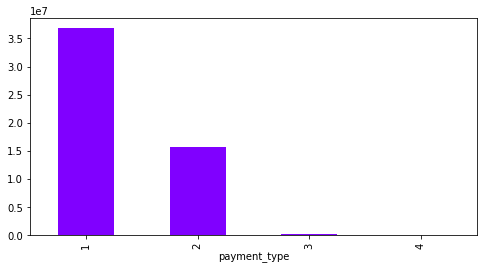

In [43]:
Myfunction1_new=Myfunction1.T.sum()
Myfunction1_new.plot(colormap='rainbow',kind='bar',figsize=(8,4),)

The most common type of payment is number 1 (credit card) and this is understandable because today it is undoubtedly more convenient, faster and less distracting than the difficulty of the remains, the withdrawal of money in the bank and so on so for

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a2e90c0b8>,
      dtype=object)

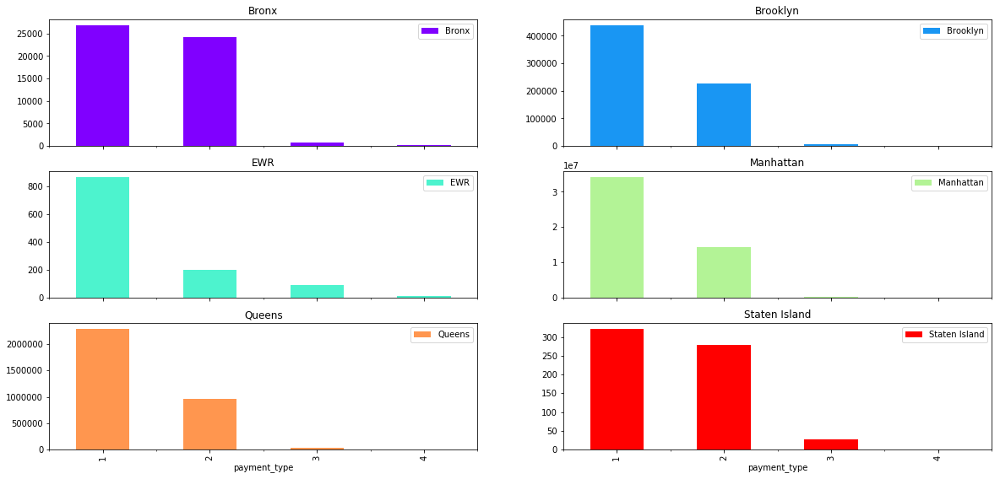

In [44]:
Myfunction1.plot(colormap='rainbow',kind='bar',figsize=(20,16),subplots=True,layout=(5,2),)

And here we try to see the same informations, but divided for each borough.

In [37]:
r=scipy.stats.chi2_contingency(Myfunction1)
r

(33897.96093393685,
 0.0,
 15,
 array([[3.63472229e+04, 4.69003523e+05, 8.17340973e+02, 3.40711442e+07,
         2.29130574e+06, 4.38010931e+02],
        [1.53862030e+04, 1.98534656e+05, 3.45989957e+02, 1.44227123e+07,
         9.69936418e+05, 1.85415131e+02],
        [2.30097515e+02, 2.96904513e+03, 5.17420897e+00, 2.15688710e+05,
         1.45052005e+04, 2.77284532e+00],
        [6.64766027e+01, 8.57775598e+02, 1.49486114e+00, 6.23138092e+04,
         4.19064262e+03, 8.01092253e-01]]))

r = scipy.stats.chi2_contingency(Myfunction1) : 

Represents the  chi-squared test  and p-value for the hypothesis test of independence, is any statistical hypothesis with values between 0 and 1.
this test often is used as short for Pearson's chi-squared test. The chi-squared test is used to determine whether there is a significant difference between the expected frequencies and the observed frequencies.

##### [CRQ2]: Visualize Taxis movements! NYC is divided in many Taxis zones. For each yellow cab trip we know the zone the Taxi pick up and drop off the users. Let's visualize, on a chropleth map, the number of trips that starts in each zone. Than, do another map to count the races that end up in the single zone. Comment your discoveries. To perform this task we use the library folium. You find some examples of chorophlet maps here and here. The Geojson we use to trace the zones is taxi_zones.json in the Homework's repository.

In [23]:
Map_to_print1=folium.Map(
    location=[40.71, -74.00], #the NYC coordinates. from 40 to -74
    zoom_start=11,                         
    tiles='Stamen Toner' #i choose  stamen toner because i like this kind of map, but there were many kind of representation.
    
)
with open('taxi_zones.json') as f: #i have imported taxi_zones
    mappa=json.load(f)
folium.GeoJson(
    mappa,
    style_function=lambda feature: {
        'fillColor': '#FF4500', # the color that i choose.
        'fill_opacity':'3',
        'color': 'magenta2',
        'weight': 1.5,
        'dashArray': '1, 1'
}
).add_to(Map_to_print1)
Map_to_print1
# In this case, I would like to show you my map here, but on GitHub this map won't be represents,so i save the map in my folder
Map_to_print1.save(os.path.join('results', r"/Users/riccardocervelli/Desktop/hm2aris/NYC.html"))



In [51]:
Map_to_print1

 Here you can find our first map.
https://github.com/CervelliRic/ADM-HW4/blob/master/NYC.html

In [25]:
for month in ['01', '02', '03', '04', '05','06']:
    data_frame = pandas.read_csv('yellow_tripdata_2018-'+month+'.csv',usecols=[7,8])
    pickup=data_frame.filter(['PULocationID'])
    len(pickup.groupby(['PULocationID']).groups.keys())
    pickupser=pickup.groupby('PULocationID')['PULocationID'].count()
    Mydfpick=pd.DataFrame(index=list(range(1,266)),columns=[])
    Mydfpick['zone']=list(range(1,266))
    counts=[]
    for i in range(1,266):
        if i in pickupser:
            counts.append(pickupser[i])
        else:
            counts.append(0)     
    Mydfpick['Taxitaken']=counts
    
    Mydfpick.head()
    drops=data_frame.filter(['DOLocationID']) 
    # the filter() method constructs an iterator from elements of an iterable for which a function returns true.
    dropser=drops.groupby('DOLocationID')['DOLocationID'].count()
    Mydf=pd.DataFrame(index=list(range(1,266)),columns=[])
    Mydf['zone']=list(range(1,266))
    counts=[]
    for i in range(1,266):
        if i in dropser:
            counts.append(dropser[i])
        else:
            counts.append(0)   #this check is mandatory because some zones are missing.
    Mydf['Taxileaved']=counts
    Mydf.head()


In [26]:
Map_to_print2 = folium.Map(
    location=[40.71, -74.00], #the NYC coordinates. from 40 to -74
    zoom_start=11,                        
    tiles='Stamen Toner'  #i choose  stamen toner because i like this kind of map, but there were many kind of representation.
                
)
Map_to_print2.choropleth(
    geo_data=mappa,  #our geojson dataset
    data=Mydfpick, #our  dataset
    columns=['zone', 'Taxitaken'],
    key_on='feature.properties.LocationID', #the key in geojson file 
    fill_color='Oranges',   
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of taxi taken',
    highlight= True     #enable the highlight function, to enable highlight functionality when you hover over each area.
)


# In this case, I would like to show you my map here, but on GitHub this map won't be represents,so i save the map in my folder
Map_to_print2.save(os.path.join('results', r"/Users/riccardocervelli/Desktop/hm2aris/NYC2.html"))

In [27]:
Map_to_print2


Our Second Map
https://github.com/CervelliRic/ADM-HW4/blob/master/NYC2.html

The choropleth map above clearly reveals the Manhattan-centric nature of yellow cab trips. I normalized the count of pickups in each neighborhood.a very strange thing is that there are many more taxi trips between Midtown Manhattan and La Guardia airport than JFK airport. The difference in the number of taxi trips to La Guardia vs. to JFK is particularly surprising because La Guardia is a much smaller airport: 
The most likely reason for the difference is that, unlike JFK, La Guardia is not reachable by subway(Google). In fact, the only public transportation option to La Guardia is a bus that runs from Upper Manhattan. While ride-sharing solutions and convenient public transportation options will not meet the needs of all travelers, having these options will help alleviate traffic congestion and reduce transportation cost for many, as suggested by the comparatively lower JFK taxi utilization.

In [28]:
Map_to_print3 = folium.Map(
    location=[40.71, -74.00],  #the NYC coordinates. from 40 to -74
    zoom_start=11,                        
    tiles='Stamen Toner'   #i choose  stamen toner because i like this kind of map, but there were many kind of representation.
               
)

Map_to_print3.choropleth(
    geo_data=mappa,#our geojson dataset
    data=Mydf,     #our  dataset
    columns=['zone', 'Taxileaved'],
    key_on='feature.properties.LocationID', #the key in geojson file 
    fill_color='Oranges',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Number of taxi drops',
    highlight=True     #enable the highlight function, to enable highlight functionality when you hover over each area.
)


# In this case, I would like to show you my map here, but on GitHub this map won't be represents,so i save the map in my folder
Map_to_print3.save(os.path.join('results', r"/Users/riccardocervelli/Desktop/hm2aris/NYC3.html"))

In [29]:
Map_to_print3

The third-one: 
https://github.com/CervelliRic/ADM-HW4/blob/master/NYC3.html

 As can be seen from the maps, Manhattan to Manhattan has the most frequent pickup and drop-off locations followed by Manhattan to Queens. As can be seen, the Others category are the rides from boroughs other than the one mentioned above. So it can be concluded that the yellow cabs rides from Staten Island to Manhattan or any other borough is quite less compared to Manhattan to Manhattan.
Our experiments revealed some interesting facts about the urban communities and their commuting patterns. The experiments show that with increasing population, the average trip times will increase and hence people will end up paying more for a ride and will end up wasting more time on commute than usual. The insights which map affluency of locations also indicate that tipping patterns vary according to areas.this analysis was very useful to understand how people move to NYC, what are the behaviors of people depending on the area, the types of payment adopted, the price per km to take a taxi depending on the time of year and still more precisely calculated at different times of day for all Boroughs.